# Start of the code

In [32]:
import sys
sys.path.append(r'/work/yzstat/yzhan/UAV_images/')
import os
import json
import cv2

import numpy as np
import glob
from numpy.random import seed
from numpy.random import randint
import joblib
import matplotlib.pyplot as plt
import random

import scipy.stats as st







import random
path = r'/work/yzstat/yzhan/Maize_images/'
result_path=r'/work/yzstat/yzhan/Maize_images_MobilenetV2_keras/'
result_path2=r'/work/yzstat/yzhan/Maize_images_MobilenetV2_random_weights/'
seed(42)

In [2]:
pred_test_dir='Multiclass_Prediction/Predict_test_Patches_lr0.001_0.5_batch16_rs50_is42_100'

In [4]:
from matplotlib.colors import ListedColormap, BoundaryNorm


In [5]:
colorsList = ['black', 'seagreen', ]

CustomCmap2 = ListedColormap(colorsList)
bounds=[0, 1, 2]
norm = BoundaryNorm(bounds, CustomCmap2.N)#, extend='min')

In [6]:
num_classes=2
train_mask_patch_list=sorted(glob.glob(path+r'/maize_label_patches/train/*.png'))
train_image_patch_list=sorted(glob.glob(path+r'/maize_image_patches/train/*.png'))
#train_image_patch_list=sorted(glob.glob(path+r'\maize_image_patches\train\*.jpg')+glob.glob(path+r'\maize_image_patches\train\*.tif'))
test_mask_patch_list=sorted(glob.glob(path+r'/maize_label_patches/test/*.png'))
test_image_patch_list=sorted(glob.glob(path+r'/maize_image_patches/test/*.png'))
#test_image_patch_list=sorted(glob.glob(path+r'\maize_image_patches\test\*.jpg')+glob.glob(path+r'\maize_image_patches\test\*.tif'))
len(test_image_patch_list)



328

In [1]:
# full size image with low quality
exclude_list=[
'103_Maize_Empty_Empty_20190628165307_20190628115307_20315-12857-9652-9000--9000.tif',

'105_Maize_Empty_Empty_20190703153927_20190703103927_29334-12848-9651-9000--8999.tif',

'106_Maize_Suat_C12_CLIT1_20190723163733_20190723113733_33844-12844-9651-8999--8999.tif',

'201_Maize_Suat_C1_CRF1_20190813195929_20190813145929_11298-19322-9651-9000--9000.tif',

'202_Maize_Suat_C2_CFIT4_20190807164953_20190807114953_15803-19330-9652-9000--8999.tif',

'205_Maize_Suat_C5_CRF3_20190717175421_20190717125421_29316-19354-9652-9000--8999.tif',

'206_Maize_Suat_C6_CFIT1_20190917180644_20190917130644_33820-19363-9651-9000--8999.tif',

'303_Maize_Empty_Empty_20190628164527_20190628114527_20298-25818-9652-9000--9000.tif',

'305_Maize_Frank_G3_DH_Full_20190819173156_20190819123156_29297-25859-9651-9000--8999.tif',

'306_Maize_Frank_G2_DH_Full_20190717175304_20190717125304_33796-25880-9652-9000--8999.tif',

'401_Maize_Frank_G1_DH_Full_20190904194409_20190904144409_11301-32235-9651-9000--8999.tif',

'402_Maize_Frank_G2_DH_Full_20190917180134_20190917130134_15795-32268-9651-9000--8999.tif',

'405_Maize_Frank_G3_DH_Full_20190910204615_20190910154615_29279-32367-9651-9000--9000.tif',

'501_Maize_Frank_G1_DH_Full_20190723161909_20190723111909_11302-38690-9651-8999--8999.tif',

'506_Maize_Frank_G2_DH_Full_20190828195655_20190828145655_33748-38917-9651-9000--8999.tif',

'506_Maize_Frank_G2_DH_Full_20190904172801_20190904122801_33748-38917-9651-9000--8999.tif',


'0308_Maize-Bai_DeKalbDKC6434-114Day-Hybrid-24k_NextMap_20200716183118_20200716133118_42903-25523-9651-9000--9000.tif',

'0508_Maize-Irmak_DKC63-90RIB_NextMap_20200716161624_20200716111624_42861-38482-9651-9000--9000.tif',


'201_Maize_Suat_C1_CRF1_20190807165031_20190807115031_11298-19322-9652-9000--8999.tif',

'201_Maize_Suat_C1_CRF1_20190819163454_20190819113454_11298-19322-9651-9000--8999.tif',

'202_Maize_Suat_C2_CFIT4_20190924164022_20190924114022_15803-19330-9652-9000--9000.tif',

'204_Maize_C4_CFIT2_20190717171915_20190717121915_24812-19346-9652-9000--8999.tif',

'205_Maize_Suat_C5_CRF3_20190917180721_20190917130721_29316-19354-9651-9000--8999.tif',

'304_Maize_Frank_G2_DL_Full_20190819165425_20190819115425_24797-25839-9651-9000--8999.tif',

'305_Maize_Empty_Empty_20190703153136_20190703103136_29297-25859-9651-9000--8999.tif',

'404_Maize_Frank_G3_DL_Full_20190910204652_20190910154652_24784-32334-9651-9000--9000.tif',


'501_Maize_G1_DH_Full_20190717170459_20190717120459_11302-38690-9651-9000--8999.tif',

'0306_Maize-Schnable_Mixed_NextMap_20200716183219_20200716133219_33953-25521-9651-9000--9000.tif',

'0308_Maize-Bai_DeKalbDKC6434-114Day-Hybrid-24k_NextMap_20200716203501_20200716153501_42903-25523-9651-9000--9000.tif',

'0312_Maize-Schachtman_Mixed_NextMap_20200702211644_20200702161644_60805-25526-9651-9000--9000.tif',

'0509_Maize-Irmak_DKC63-90RIB_NextMap_20200716202301_20200716152301_47333-38476-9651-9000--9000.tif',

'0909_Maize-Irmak_DKC63-90RIB_NextMap_20200803165435_20200803115435_47696-64132-9651-18000--9000.tif',
]

exclude_files=[f.split('.')[0] for f in exclude_list]



# IoU plot for 30 seeds, include scenarios which the model was not trained well

### Range plot

['10', '50', '100', '200', '400', '600', '750']
random
test_10.pkl
random
test_50.pkl
random
test_100.pkl
random
test_200.pkl
random
test_400.pkl
random
test_600.pkl
random
test_750.pkl
30


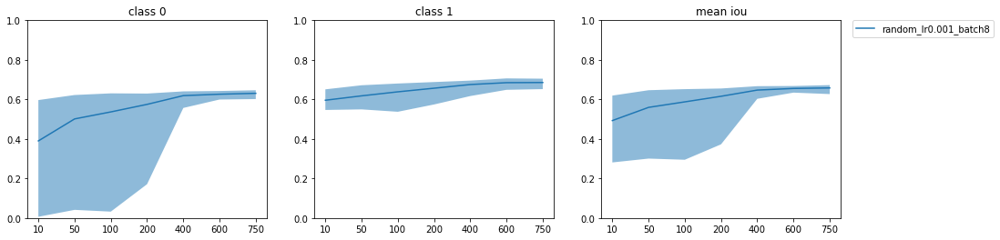

"\n\n\n\n#axs[-1].axis('off')\nfor i in range(2):\n\n    #plt.yticks(np.arange(0.5, 1, 10))\n    #ax=plt.subplot(1,5,i+1)\n    axs[i].yaxis.set_tick_params(labelbottom=True, labelsize=size)\n    axs[i].plot(x[start: end], np.array(avg_random_iou)[start: end, i], label='random')\n    #axs[i].plot(x[start: end], np.array(avg_gi_iou)[start: end, i], label='green index')\n\n    axs[i].set_yticks([0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1, 1.1])\n    axs[i].set_ylabel('IoU$_{}$'.format(i), fontsize = size )\n    axs[i].set_xlabel('sample size', fontsize=size)\n    axs[i].set_xticks(x[start: end])\n    axs[i].set_xticklabels(x[start: end], rotation =90,fontsize=size)\n    axs[i].set_ylim(0.4, 0.8)\n    #axs[i].set_yticks(np.arange(0.5, 1, 10))\n    #axs[i].set_xlim(40, 800)\n    #plt.show()\n\n\n\n\n#plt.subplot(155)\naxs[-1].yaxis.set_tick_params(labelbottom=True, labelsize=size)\naxs[-1].plot(x[start: end], np.array(avg_random_mean_iou)[start: end], label='random')\n#axs[-1].plot(x[start: end], np.a

In [12]:
all_random_iou, all_random_iou2, all_random_miou, all_random_miou2=[], [], [], []
all_gi_iou, all_gi_miou=[], []

lr, dropout_rate, batch_size, seed, image_seed=0.001, 0.5, 8, 50, 42
mgray_list=joblib.load(result_path+'/multiclass/iou_pkl_dropout_lr'+str(lr)+ \
                                       '_0.5_batch'+str(batch_size)+'_rs50_is'+str(image_seed)+\
                       '/test_grayness.pkl')
inds=np.argsort(mgray_list)
q=0.2
#quant=np.quantile(mgray_list, q)
quant=int(len(mgray_list)*q)

x=[10, 50, 100, 200, 400, 600, 750]
x=[str(int(xi)) for xi in x]
print(x)

start, end=0, len(x)
#x=np.linspace(50, 400, 8)
#x=np.append(np.linspace(10, 50, 5), 824)

#plt.subplots(figsize=(16, 4))
fig, axs = plt.subplots(1, 3, figsize=(16,4), sharey=True)

#for image_seed in np.linspace(10, 290, 29):
for image_seed in np.concatenate(([42], np.linspace(10, 290, 29)))[:]:
    #r'multiclass/dropout_rate_active_learning_lr' + str(lr) + '_' +\
#    str(dropout_rate)+'_batch' + str(batch_size)+\
#'_select_ratio'+str(select_ratio)+'_rs'+str(seed)+'_is'+str(image_seed)
    #iou_pkl_dropout_lr0.001_0.5_batch16_rs50_is42
    image_seed=int(image_seed)
    
    iou_files=sorted(glob.glob(result_path+'multiclass/iou_pkl_dropout_lr'+str(lr)+\
                               '_0.5_batch'+str(batch_size)+'_rs50_is'+\
                               str(image_seed)+\
                              '//test_[0-9]*.pkl'),\
                     key = lambda x: int(os.path.basename(x).split('_')[-1].split('.')[0])) 
    random_iou, random_iou2=[], []
    random_mean_iou, random_mean_iou2=[], []
    
    for file in iou_files[:]:
        
        #print(os.path.basename(file))
        filename=os.path.basename(file)
        if '_2.pkl' in filename or '_4.pkl' in filename or '_6.pkl' in filename or '_8.pkl' in filename or \
         '_350.pkl' in filename or '_5.pkl' in filename or '_25.pkl' in filename or\
        '_140.pkl' in filename or '_180.pkl' in filename \
        or '_500.pkl' in filename or '700.pkl' in filename or '824.pkl' in filename: continue
 

        #print(os.path.basename(file))
        if image_seed ==42: 
            print('random')
            print(os.path.basename(file))
        
        iou=joblib.load(file) #all image patch iou of one model prediction
   
        iou=np.nanmean(iou, axis=0) #dim:2, Iou0, iou for that one model prediction

        random_iou.append(iou)
      
    
        #std_random_iou.append(np.std(iou_g1, ddof=1, axis=0))
        #std_random_iou2.append(np.std(iou_g2, ddof=1, axis=0))
        #print(iou)
        mean_iou=np.nanmean(iou) #mean iou: miou
    
        #std_random_miou.append(np.std(miou_g1, ddof=1, axis=0))   
        #std_random_miou2.append(np.std(miou_g1, ddof=1, axis=0))
     

        random_mean_iou.append(mean_iou)
 
        
        
        #miou=np.mean(mean_iou)

        #var_iou=np.nanvar(iou, axis=0)
        #print(iou,mean_iou)
    if len(random_iou) != len(x): print(image_seed)
    all_random_iou.append(random_iou)
    all_random_miou.append(random_mean_iou)




    iou_files=sorted(glob.glob(result_path+'multiclass/iou_pkl_dropout_lr'+str(lr)+\
                               '_0.5_green_index_batch'+str(batch_size)+'_rs50_is'+\
                               str(image_seed)+\
                              '//test_[0-9]*.pkl'),\
                                key = lambda x: int(os.path.basename(x).split('_')[-1].split('.')[0])) 
    gi_iou=[]
    gi_mean_iou=[]
    for file in iou_files[:]:
        filename=os.path.basename(file)
        if '_350.pkl' in filename or '_400.pkl' in filename or \
        '_140.pkl' in filename or '_180.pkl' in filename \
        or '_500.pkl' in filename or '700.pkl' in filename or '_1340.pkl' in filename: continue
        if image_seed ==10: 
            print('green index')
            print(os.path.basename(file))
      
        iou=joblib.load(file)
        mean_iou=np.nanmean(iou, axis=0) 
        gi_iou.append(iou)
        gi_mean_iou.append(mean_iou)
        #miou=np.mean(mean_iou)
        #var_iou=np.nanvar(iou, axis=0)
        #print(iou,mean_iou)
        
    all_gi_iou.append(gi_iou)
    all_gi_miou.append(gi_mean_iou)
    
    


avg_random_iou = np.mean(all_random_iou, axis=0)
avg_random_mean_iou = np.mean(all_random_miou, axis=0)


std_random_iou = np.std(all_random_iou, ddof=1, axis=0)
std_random_miou = np.std(all_random_miou, ddof=1, axis=0)


avg_gi_iou = np.mean(all_gi_iou, axis=0)
avg_gi_mean_iou = np.mean(all_gi_miou, axis=0)

n=len(all_random_iou)
print(n)
lower_band_random_iou, upper_band_random_iou=np.array(avg_random_iou)-\
    st.t.ppf(1-0.025, n-1)*np.array(std_random_iou), \
    np.array(avg_random_iou)+st.t.ppf(1-0.025, n-1)*np.array(std_random_iou)
lower_band_random_miou, upper_band_random_miou=np.array(avg_random_mean_iou)-\
    st.t.ppf(1-0.025, n-1)*np.array(std_random_miou), \
    np.array(avg_random_mean_iou)+st.t.ppf(1-0.025, n-1)*np.array(std_random_miou)






for i in range(2):
    #plt.yticks(np.arange(0.5, 1, 10))
    #ax=plt.subplot(1,5,i+1)


    axs[i].fill_between(x[start: end], np.max(all_random_iou, axis=0)[start: end, i], \
           np.min(all_random_iou, axis=0)[start: end, i], alpha=0.5)
    axs[i].yaxis.set_tick_params(labelbottom=True)
    axs[i].plot(x[start: end], np.array(avg_random_iou)[start: end, i], label='random_lr'+\
                str(lr)+'_batch'+str(batch_size))


    #axs[i].plot(x[start: end], np.array(homogeneity_iou)[:, i], label='homogeneity', color='black')
   # plt.plot(x[:10], np.array(manual_iou)[:, i], label='manual')
    #plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
    axs[i].set_title('class ' + str(i))

    #axs[i].set_yticks(np.arange(0.1, 1, 10))
    axs[i].set_ylim(0, 1)

    #plt.show()

#plt.subplot(155)
axs[-1].yaxis.set_tick_params(labelbottom=True)
axs[-1].plot(x[start: end], np.array(avg_random_mean_iou)[start: end], label='random_lr'+\
                str(lr)+'_batch'+str(batch_size))


axs[-1].fill_between(x[start: end], np.max(all_random_miou, axis=0)[start: end], \
       np.array(np.min(all_random_miou, axis=0))[start: end], alpha=.5)


axs[-1].legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
axs[-1].set_title('mean iou')
#plt.savefig(result_path+'/Multiclass/visualization/test_iou_full.png', bbox_inches='tight', dpi=600)
#plt.savefig(result_path+'/Multiclass/visualization/test_iou_full.png', bbox_inches='tight', dpi=600)
plt.show()


### confidence interval : mean+-t*std

['10', '50', '100', '200', '400', '600', '750']
random
test_10.pkl
random
test_50.pkl
random
test_100.pkl
random
test_200.pkl
random
test_400.pkl
random
test_600.pkl
random
test_750.pkl
30


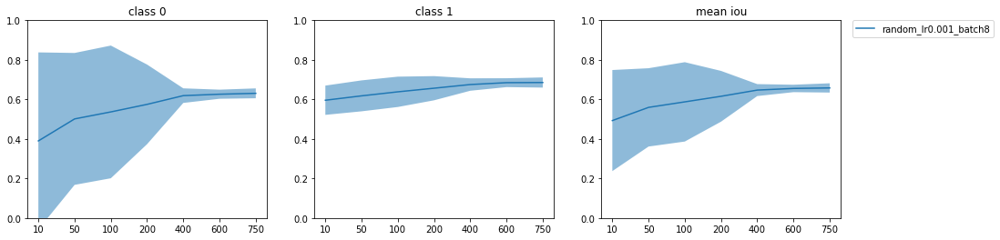

"\n\n\n\n#axs[-1].axis('off')\nfor i in range(2):\n\n    #plt.yticks(np.arange(0.5, 1, 10))\n    #ax=plt.subplot(1,5,i+1)\n    axs[i].yaxis.set_tick_params(labelbottom=True, labelsize=size)\n    axs[i].plot(x[start: end], np.array(avg_random_iou)[start: end, i], label='random')\n    #axs[i].plot(x[start: end], np.array(avg_gi_iou)[start: end, i], label='green index')\n\n    axs[i].set_yticks([0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1, 1.1])\n    axs[i].set_ylabel('IoU$_{}$'.format(i), fontsize = size )\n    axs[i].set_xlabel('sample size', fontsize=size)\n    axs[i].set_xticks(x[start: end])\n    axs[i].set_xticklabels(x[start: end], rotation =90,fontsize=size)\n    axs[i].set_ylim(0.4, 0.8)\n    #axs[i].set_yticks(np.arange(0.5, 1, 10))\n    #axs[i].set_xlim(40, 800)\n    #plt.show()\n\n\n\n\n#plt.subplot(155)\naxs[-1].yaxis.set_tick_params(labelbottom=True, labelsize=size)\naxs[-1].plot(x[start: end], np.array(avg_random_mean_iou)[start: end], label='random')\n#axs[-1].plot(x[start: end], np.a

In [10]:
all_random_iou, all_random_iou2, all_random_miou, all_random_miou2=[], [], [], []
all_gi_iou, all_gi_miou=[], []

lr, dropout_rate, batch_size, seed, image_seed=0.001, 0.5, 8, 50, 42
mgray_list=joblib.load(result_path+'/multiclass/iou_pkl_dropout_lr'+str(lr)+ \
                                       '_0.5_batch'+str(batch_size)+'_rs50_is'+str(image_seed)+\
                       '/test_grayness.pkl')
inds=np.argsort(mgray_list)
q=0.2
#quant=np.quantile(mgray_list, q)
quant=int(len(mgray_list)*q)

x=[10, 50, 100, 200, 400, 600, 750]
x=[str(int(xi)) for xi in x]
print(x)

start, end=0, len(x)
#x=np.linspace(50, 400, 8)
#x=np.append(np.linspace(10, 50, 5), 824)

#plt.subplots(figsize=(16, 4))
fig, axs = plt.subplots(1, 3, figsize=(16,4), sharey=True)

#for image_seed in np.linspace(10, 290, 29):
for image_seed in np.concatenate(([42], np.linspace(10, 290, 29)))[:]:
    #r'multiclass/dropout_rate_active_learning_lr' + str(lr) + '_' +\
#    str(dropout_rate)+'_batch' + str(batch_size)+\
#'_select_ratio'+str(select_ratio)+'_rs'+str(seed)+'_is'+str(image_seed)
    #iou_pkl_dropout_lr0.001_0.5_batch16_rs50_is42
    image_seed=int(image_seed)
    
    iou_files=sorted(glob.glob(result_path+'multiclass/iou_pkl_dropout_lr'+str(lr)+\
                               '_0.5_batch'+str(batch_size)+'_rs50_is'+\
                               str(image_seed)+\
                              '//test_[0-9]*.pkl'),\
                     key = lambda x: int(os.path.basename(x).split('_')[-1].split('.')[0])) 
    random_iou, random_iou2=[], []
    random_mean_iou, random_mean_iou2=[], []
    
    for file in iou_files[:]:
        
        #print(os.path.basename(file))
        filename=os.path.basename(file)
        if '_2.pkl' in filename or '_4.pkl' in filename or '_6.pkl' in filename or '_8.pkl' in filename or \
         '_350.pkl' in filename or '_5.pkl' in filename or '_25.pkl' in filename or\
        '_140.pkl' in filename or '_180.pkl' in filename \
        or '_500.pkl' in filename or '700.pkl' in filename or '824.pkl' in filename: continue
 

        #print(os.path.basename(file))
        if image_seed ==42: 
            print('random')
            print(os.path.basename(file))
        
        iou=joblib.load(file) #all image patch iou of one model prediction
   
        iou=np.nanmean(iou, axis=0) #dim:2, Iou0, iou for that one model prediction

        random_iou.append(iou)
      
    
        #std_random_iou.append(np.std(iou_g1, ddof=1, axis=0))
        #std_random_iou2.append(np.std(iou_g2, ddof=1, axis=0))
        #print(iou)
        mean_iou=np.nanmean(iou) #mean iou: miou
    
        #std_random_miou.append(np.std(miou_g1, ddof=1, axis=0))   
        #std_random_miou2.append(np.std(miou_g1, ddof=1, axis=0))
     

        random_mean_iou.append(mean_iou)
 
        
        
        #miou=np.mean(mean_iou)

        #var_iou=np.nanvar(iou, axis=0)
        #print(iou,mean_iou)
    if len(random_iou) != len(x): print(image_seed)
    all_random_iou.append(random_iou)
    all_random_miou.append(random_mean_iou)




    iou_files=sorted(glob.glob(result_path+'multiclass/iou_pkl_dropout_lr'+str(lr)+\
                               '_0.5_green_index_batch'+str(batch_size)+'_rs50_is'+\
                               str(image_seed)+\
                              '//test_[0-9]*.pkl'),\
                                key = lambda x: int(os.path.basename(x).split('_')[-1].split('.')[0])) 
    gi_iou=[]
    gi_mean_iou=[]
    for file in iou_files[:]:
        filename=os.path.basename(file)
        if '_350.pkl' in filename or '_400.pkl' in filename or \
        '_140.pkl' in filename or '_180.pkl' in filename \
        or '_500.pkl' in filename or '700.pkl' in filename or '_1340.pkl' in filename: continue
        if image_seed ==10: 
            print('green index')
            print(os.path.basename(file))
      
        iou=joblib.load(file)
        mean_iou=np.nanmean(iou, axis=0) 
        gi_iou.append(iou)
        gi_mean_iou.append(mean_iou)
        #miou=np.mean(mean_iou)
        #var_iou=np.nanvar(iou, axis=0)
        #print(iou,mean_iou)
        
    all_gi_iou.append(gi_iou)
    all_gi_miou.append(gi_mean_iou)
    
    


avg_random_iou = np.mean(all_random_iou, axis=0)
avg_random_mean_iou = np.mean(all_random_miou, axis=0)


std_random_iou = np.std(all_random_iou, ddof=1, axis=0)
std_random_miou = np.std(all_random_miou, ddof=1, axis=0)


avg_gi_iou = np.mean(all_gi_iou, axis=0)
avg_gi_mean_iou = np.mean(all_gi_miou, axis=0)

n=len(all_random_iou)
print(n)
lower_band_random_iou, upper_band_random_iou=np.array(avg_random_iou)-\
    st.t.ppf(1-0.025, n-1)*np.array(std_random_iou), \
    np.array(avg_random_iou)+st.t.ppf(1-0.025, n-1)*np.array(std_random_iou)
lower_band_random_miou, upper_band_random_miou=np.array(avg_random_mean_iou)-\
    st.t.ppf(1-0.025, n-1)*np.array(std_random_miou), \
    np.array(avg_random_mean_iou)+st.t.ppf(1-0.025, n-1)*np.array(std_random_miou)



#lower_band_diff_iou, upper_band_diff_iou=st.t.interval(alpha=0.95, df=len(iou_g1)-1, \
#                                                       loc=np.mean(iou_g1, axis=1), scale=st.sem(iou_g1, axis=1)) 




for i in range(2):
    #plt.yticks(np.arange(0.5, 1, 10))
    #ax=plt.subplot(1,5,i+1)


    axs[i].fill_between(x[start: end], np.array(lower_band_random_iou)[start: end, i], \
           np.array(upper_band_random_iou)[start: end, i], alpha=0.5)
    axs[i].yaxis.set_tick_params(labelbottom=True)
    axs[i].plot(x[start: end], np.array(avg_random_iou)[start: end, i], label='random_lr'+\
                str(lr)+'_batch'+str(batch_size))

    #plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
    axs[i].set_title('class ' + str(i))

    #axs[i].set_yticks(np.arange(0.1, 1, 10))
    axs[i].set_ylim(0, 1)

    #plt.show()

#plt.subplot(155)
axs[-1].yaxis.set_tick_params(labelbottom=True)
axs[-1].plot(x[start: end], np.array(avg_random_mean_iou)[start: end], label='random_lr'+\
                str(lr)+'_batch'+str(batch_size))


axs[-1].fill_between(x[start: end], np.array(lower_band_random_miou)[start: end], \
       np.array(upper_band_random_miou)[start: end], alpha=.5)

axs[-1].legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
axs[-1].set_title('mean iou')
#plt.savefig(result_path+'/Multiclass/visualization/test_iou_full.png', bbox_inches='tight', dpi=600)
#plt.savefig(result_path+'/Multiclass/visualization/test_iou_full.png', bbox_inches='tight', dpi=600)
plt.show()


### histogram to choose train/val IoU threshold for sampling 30 seeds where the models were trained well

['10', '50', '100', '200', '400', '600', '750']
random
val_10.pkl
random
val_50.pkl
random
val_100.pkl
random
val_200.pkl
random
val_400.pkl
random
val_600.pkl
random
val_750.pkl
30


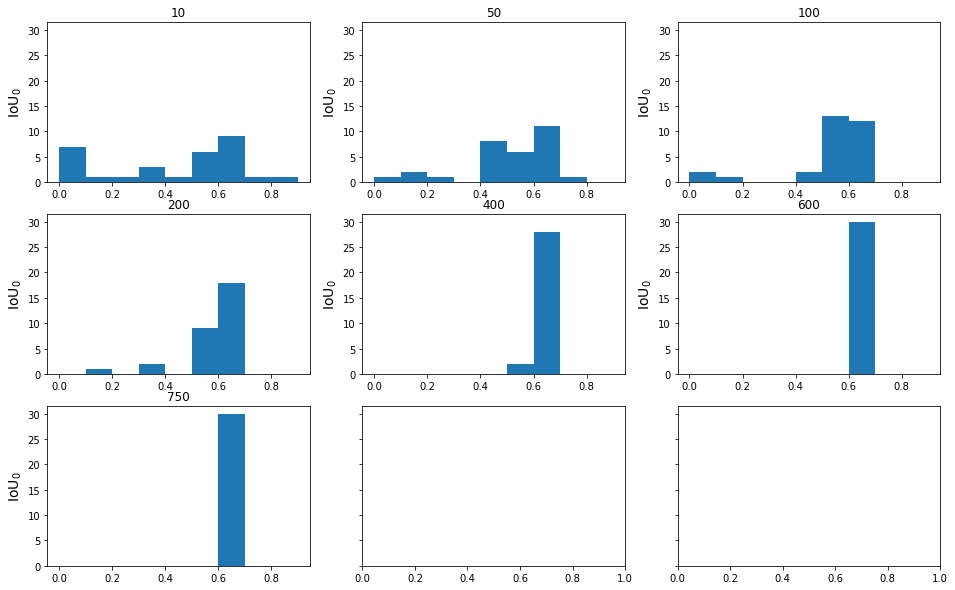

In [31]:
all_random_iou, all_random_iou2, all_random_miou, all_random_miou2=[], [], [], []
all_gi_iou, all_gi_miou=[], []

lr, dropout_rate, batch_size, seed, image_seed=0.001, 0.5, 8, 50, 42
mgray_list=joblib.load(result_path+'/multiclass/iou_pkl_dropout_lr'+str(lr)+ \
                                       '_0.5_batch'+str(batch_size)+'_rs50_is'+str(image_seed)+\
                       '/test_grayness.pkl')
inds=np.argsort(mgray_list)
q=0.2
#quant=np.quantile(mgray_list, q)
quant=int(len(mgray_list)*q)
size = 14
x=[10, 50, 100, 200, 400, 600, 750]
x=[str(int(xi)) for xi in x]
print(x)

start, end=0, len(x)
#x=np.linspace(50, 400, 8)
#x=np.append(np.linspace(10, 50, 5), 824)

#plt.subplots(figsize=(16, 4))
fig, axes = plt.subplots(3, 3, figsize=(16,10), sharey=True)#, sharex=True)
axs= [item for sublist in axes for item in sublist]
#for image_seed in np.linspace(10, 290, 29):
for image_seed in np.concatenate(([42], np.linspace(10, 290, 29)))[:]:
    #r'multiclass/dropout_rate_active_learning_lr' + str(lr) + '_' +\
#    str(dropout_rate)+'_batch' + str(batch_size)+\
#'_select_ratio'+str(select_ratio)+'_rs'+str(seed)+'_is'+str(image_seed)
    #iou_pkl_dropout_lr0.001_0.5_batch16_rs50_is42
    image_seed=int(image_seed)

    iou_files=sorted(glob.glob(result_path+'multiclass/iou_pkl_dropout_lr'+str(lr)+\
                               '_0.5_batch'+str(batch_size)+'_rs50_is'+\
                               str(image_seed)+\
                              '//val_[0-9]*.pkl'),\
                     key = lambda x: int(os.path.basename(x).split('_')[-1].split('.')[0])) 
    random_iou, random_iou2=[], []
    random_mean_iou, random_mean_iou2=[], []
    if not iou_files: print(image_seed)
    
    for file in iou_files[:]:
        
        #print(os.path.basename(file))
        filename=os.path.basename(file)
        if '_2.pkl' in filename or '_4.pkl' in filename or '_6.pkl' in filename or '_8.pkl' in filename or \
         '_350.pkl' in filename or '_5.pkl' in filename or '_25.pkl' in filename or\
        '_140.pkl' in filename or '_180.pkl' in filename \
        or '_500.pkl' in filename or '700.pkl' in filename or '824.pkl' in filename: continue
 

        #print(os.path.basename(file))
        if image_seed ==42: 
            print('random')
            print(os.path.basename(file))
        
        iou=joblib.load(file) #all image patch iou of one model prediction
   
        iou=np.nanmean(iou, axis=0) #dim:2, Iou0, iou for that one model prediction

        random_iou.append(iou)
      
    
        #std_random_iou.append(np.std(iou_g1, ddof=1, axis=0))
        #std_random_iou2.append(np.std(iou_g2, ddof=1, axis=0))
        #print(iou)
        mean_iou=np.nanmean(iou) #mean iou: miou
    
        #std_random_miou.append(np.std(miou_g1, ddof=1, axis=0))   
        #std_random_miou2.append(np.std(miou_g1, ddof=1, axis=0))
     

        random_mean_iou.append(mean_iou)
 
        
        
        #miou=np.mean(mean_iou)

        #var_iou=np.nanvar(iou, axis=0)
        #print(iou,mean_iou)
    if len(random_iou) != len(x): print(image_seed)
    all_random_iou.append(random_iou)
    all_random_miou.append(random_mean_iou)


    


avg_random_iou = np.mean(all_random_iou, axis=0)
avg_random_mean_iou = np.mean(all_random_miou, axis=0)


std_random_iou = np.std(all_random_iou, ddof=1, axis=0)
std_random_miou = np.std(all_random_miou, ddof=1, axis=0)


avg_gi_iou = np.mean(all_gi_iou, axis=0)
avg_gi_mean_iou = np.mean(all_gi_miou, axis=0)

n=len(all_random_iou)
print(n)
lower_band_random_iou, upper_band_random_iou=np.array(avg_random_iou)-\
    st.t.ppf(1-0.025, n-1)*np.array(std_random_iou), \
    np.array(avg_random_iou)+st.t.ppf(1-0.025, n-1)*np.array(std_random_iou)
lower_band_random_miou, upper_band_random_miou=np.array(avg_random_mean_iou)-\
    st.t.ppf(1-0.025, n-1)*np.array(std_random_miou), \
    np.array(avg_random_mean_iou)+st.t.ppf(1-0.025, n-1)*np.array(std_random_miou)



#lower_band_diff_iou, upper_band_diff_iou=st.t.interval(alpha=0.95, df=len(iou_g1)-1, \
#                                                       loc=np.mean(iou_g1, axis=1), scale=st.sem(iou_g1, axis=1)) 


bins_list = [0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
for i in range(start, end):
    #plt.yticks(np.arange(0.5, 1, 10))
    #ax=plt.subplot(1,5,i+1)

#plt.hist(np.array(all_random_iou)[:, 0, 0])
    axs[i].yaxis.set_tick_params(labelbottom=True)
    axs[i].hist(np.array(all_random_iou)[:, i, 0], label='random_lr'+\
                str(lr)+'_batch'+str(batch_size), bins=bins_list)

    axs[i].set_ylabel('IoU$_{}$'.format(0), fontsize = size )

    #axs[i].plot(x[start: end], np.array(concate_4_iou)[start: end, i], label='cnn 4', color ='red')
    #axs[i].plot(x[start: end], np.array(contrast_iou)[:10, i], label='contrast', color='purple')

    #axs[i].plot(x[start: end], np.array(homogeneity_iou)[:, i], label='homogeneity', color='black')
   # plt.plot(x[:10], np.array(manual_iou)[:, i], label='manual')
    #plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
    axs[i].set_title(x[i])
    
    #axs[i].set_yticks(np.arange(0.1, 1, 10))
   # axs[i].set_ylim(0, 1)

    #plt.show()


### training IoU>0.5, val IoU>0.6

# Sample 30 seeds based on val_iou thresholding

### 1. threshold all the seeds that meet the two conditions

In [10]:
image_list1=np.concatenate(([42], np.linspace(10, 290, 29)))

In [11]:
all_random_iou1, all_random_iou2, all_random_miou, all_random_miou2=[], [], [], []
all_gi_iou, all_gi_miou=[], []

lr, dropout_rate, batch_size, seed, image_seed=0.001, 0.5, 8, 50, 42
mgray_list=joblib.load(result_path+'/multiclass/iou_pkl_dropout_lr'+str(lr)+ \
                                       '_0.5_batch'+str(batch_size)+'_rs50_is'+str(image_seed)+\
                       '/test_grayness.pkl')

size = 14
x=[10, 50, 100, 200, 400]#, 600, 750]
x=[str(int(xi)) for xi in x]
print(x)
random.seed(42)
start, end=0, len(x)

for image_seed in np.concatenate((image_list1, np.linspace(300, 330, 31)))[:]:
  
    image_seed=int(image_seed)
    # val IoU
    iou_files=sorted(glob.glob(result_path+'multiclass/iou_pkl_dropout_lr'+str(lr)+\
                               '_0.5_batch'+str(batch_size)+'_rs50_is'+\
                               str(image_seed)+\
                              '//val_[0-9]*.pkl'),\
                     key = lambda x: int(os.path.basename(x).split('_')[-1].split('.')[0])) 
    random_iou, random_iou2=[], []
    random_mean_iou, random_mean_iou2=[], []
    if not iou_files: print(image_seed)
    
    for file in iou_files[:]:
        
        #print(os.path.basename(file))
        filename=os.path.basename(file)
        if '_2.pkl' in filename or '_4.pkl' in filename or '_6.pkl' in filename or '_8.pkl' in filename or \
         '_350.pkl' in filename or '_5.pkl' in filename or '_25.pkl' in filename or\
        '_140.pkl' in filename or '_180.pkl' in filename or '_600.pkl' in filename or '_750.pkl' in filename \
        or '_500.pkl' in filename or '700.pkl' in filename or '824.pkl' in filename: continue
 

        #print(os.path.basename(file))
        if image_seed ==42: 
            print('random')
            print(os.path.basename(file))
        
        iou=joblib.load(file) #all image patch iou of one model prediction
   
        iou=np.nanmean(iou, axis=0) #dim:2, Iou0, iou for that one model prediction

        random_iou.append(iou)
      
   
        mean_iou=np.nanmean(iou) #mean iou: miou

        random_mean_iou.append(mean_iou)
 
        
        
        #miou=np.mean(mean_iou)

        #var_iou=np.nanvar(iou, axis=0)
        #print(iou,mean_iou)
    if len(random_iou) != len(x): print(image_seed)
    all_random_iou1.append(random_iou)
    all_random_miou.append(random_mean_iou)
    
    
    # training IoU
    iou_files=sorted(glob.glob(result_path+'multiclass/iou_pkl_dropout_lr'+str(lr)+\
                               '_0.5_batch'+str(batch_size)+'_rs50_is'+\
                               str(image_seed)+\
                              '//train_[0-9]*.pkl'),\
                     key = lambda x: int(os.path.basename(x).split('_')[-1].split('.')[0])) 
    random_iou, random_iou2=[], []
    random_mean_iou, random_mean_iou2=[], []
    if not iou_files: print(image_seed)
    
    for file in iou_files[:]:
        
        #print(os.path.basename(file))
        filename=os.path.basename(file)
        if '_2.pkl' in filename or '_4.pkl' in filename or '_6.pkl' in filename or '_8.pkl' in filename or \
         '_350.pkl' in filename or '_5.pkl' in filename or '_25.pkl' in filename or\
        '_140.pkl' in filename or '_180.pkl' in filename or '_600.pkl' in filename or '_750.pkl' in filename \
        or '_500.pkl' in filename or '700.pkl' in filename or '824.pkl' in filename: continue
 

        #print(os.path.basename(file))
        if image_seed ==42: 
            print('random')
            print(os.path.basename(file))
        
        iou=joblib.load(file) #all image patch iou of one model prediction
   
        iou=np.nanmean(iou, axis=0) #dim:2, Iou0, iou for that one model prediction

        random_iou.append(iou)
      

        mean_iou=np.nanmean(iou) #mean iou: miou

        random_mean_iou.append(mean_iou)
        
        #miou=np.mean(mean_iou)

        #var_iou=np.nanvar(iou, axis=0)
        #print(iou,mean_iou)
    if len(random_iou) != len(x): print(image_seed)
    all_random_iou2.append(random_iou)
    all_random_miou.append(random_mean_iou)
    
    
    
    
    
# thresholding: training IoU>0.5, validation IoU>0.6
sampled_all_random_iou=np.zeros([30, len(x), 2])
sample_iou_index={}
for i in range(start, end):
    candidate_iou_index1=np.where(np.array(all_random_iou1)[:, i, 0]>0.5)[0]
    candidate_iou_index2=np.where(np.array(all_random_iou2)[:, i, 0]>0.6)[0]
    print(i)
    candidate_iou_index=[x for x in candidate_iou_index1 if x in candidate_iou_index2]
    sample_iou_index[x[i]]=random.sample(list(candidate_iou_index), 30)  
    


['10', '50', '100', '200', '400']
random
val_10.pkl
random
val_50.pkl
random
val_100.pkl
random
val_200.pkl
random
val_400.pkl
random
train_10.pkl
random
train_50.pkl
random
train_100.pkl
random
train_200.pkl
random
train_400.pkl
0
1
2
3
4


### 2. sample 30 seeds

In [12]:
all_random_iou, all_random_iou2, all_random_miou, all_random_miou2=[], [], [], []
all_gi_iou, all_gi_miou=[], []

lr, dropout_rate, batch_size, seed, image_seed=0.001, 0.5, 8, 50, 42
mgray_list=joblib.load(result_path+'/multiclass/iou_pkl_dropout_lr'+str(lr)+ \
                                       '_0.5_batch'+str(batch_size)+'_rs50_is'+str(image_seed)+\
                       '/test_grayness.pkl')
inds=np.argsort(mgray_list)
q=0.2
#quant=np.quantile(mgray_list, q)
quant=int(len(mgray_list)*q)
size = 14
x=[10, 50, 100, 200, 400]#, 600, 750]
x=[str(int(xi)) for xi in x]
print(x)
random.seed(42)
start, end=0, len(x)

for image_seed in np.concatenate((image_list1, np.linspace(300, 330, 31)))[:]:
    #r'multiclass/dropout_rate_active_learning_lr' + str(lr) + '_' +\
#    str(dropout_rate)+'_batch' + str(batch_size)+\
#'_select_ratio'+str(select_ratio)+'_rs'+str(seed)+'_is'+str(image_seed)
    #iou_pkl_dropout_lr0.001_0.5_batch16_rs50_is42
    image_seed=int(image_seed)

    iou_files=sorted(glob.glob(result_path+'multiclass/iou_pkl_dropout_lr'+str(lr)+\
                               '_0.5_batch'+str(batch_size)+'_rs50_is'+\
                               str(image_seed)+\
                              '//test_[0-9]*.pkl'),\
                     key = lambda x: int(os.path.basename(x).split('_')[-1].split('.')[0])) 
    random_iou, random_iou2=[], []
    random_mean_iou, random_mean_iou2=[], []
    if not iou_files: print(image_seed)
    
    for file in iou_files[:]:
        
        #print(os.path.basename(file))
        filename=os.path.basename(file)
        if '_2.pkl' in filename or '_4.pkl' in filename or '_6.pkl' in filename or '_8.pkl' in filename or \
         '_350.pkl' in filename or '_5.pkl' in filename or '_25.pkl' in filename or\
        '_140.pkl' in filename or '_180.pkl' in filename or '_600.pkl' in filename or '_750.pkl' in filename \
        or '_500.pkl' in filename or '700.pkl' in filename or '824.pkl' in filename: continue
 

        #print(os.path.basename(file))
        if image_seed ==42: 
            print('random')
            print(os.path.basename(file))
        
        iou=joblib.load(file) #all image patch iou of one model prediction
   
        iou=np.nanmean(iou, axis=0) #dim:2, Iou0, iou for that one model prediction

        random_iou.append(iou)
      
    
        #std_random_iou.append(np.std(iou_g1, ddof=1, axis=0))
        #std_random_iou2.append(np.std(iou_g2, ddof=1, axis=0))
        #print(iou)
        mean_iou=np.nanmean(iou) #mean iou: miou
    
        #std_random_miou.append(np.std(miou_g1, ddof=1, axis=0))   
        #std_random_miou2.append(np.std(miou_g1, ddof=1, axis=0))
     

        random_mean_iou.append(mean_iou)
 
        
        
        #miou=np.mean(mean_iou)

        #var_iou=np.nanvar(iou, axis=0)
        #print(iou,mean_iou)
    if len(random_iou) != len(x): print(image_seed)
    all_random_iou.append(random_iou)
    all_random_miou.append(random_mean_iou)

for i in range(start, end):
    sampled_all_random_iou[:, i, :]=np.array(all_random_iou)[sample_iou_index[x[i]], i, :]

['10', '50', '100', '200', '400']
random
test_10.pkl
random
test_50.pkl
random
test_100.pkl
random
test_200.pkl
random
test_400.pkl


### 3. range and CI plots

[10, 50, 100, 200, 400, 600, 750]
random
test_600.pkl
random
test_750.pkl
30


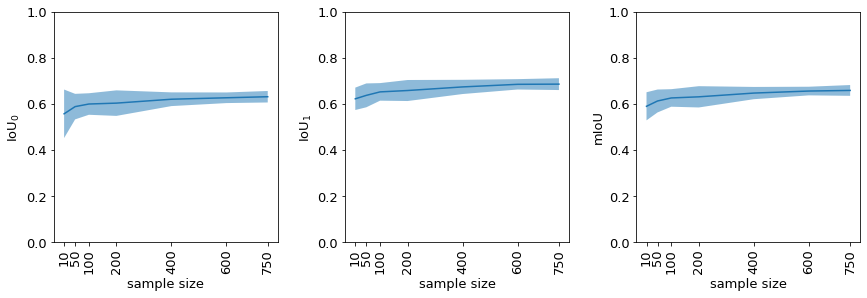

In [13]:
all_random_iou, all_random_iou2, all_random_miou, all_random_miou2=[], [], [], []
all_gi_iou, all_gi_miou=[], []

lr, dropout_rate, batch_size, seed, image_seed=0.001, 0.5, 8, 50, 42
mgray_list=joblib.load(result_path+'/multiclass/iou_pkl_dropout_lr'+str(lr)+ \
                                       '_0.5_batch'+str(batch_size)+'_rs50_is'+str(image_seed)+\
                       '/test_grayness.pkl')
inds=np.argsort(mgray_list)
q=0.2
#quant=np.quantile(mgray_list, q)
quant=int(len(mgray_list)*q)

x=[10, 50, 100, 200, 400, 600, 750]
#x=[str(int(xi)) for xi in x]
print(x)
size = 13
start, end=0, len(x)
#x=np.linspace(50, 400, 8)
#x=np.append(np.linspace(10, 50, 5), 824)

#plt.subplots(figsize=(16, 4))
fig, axs = plt.subplots(1, 3, figsize=(14,4), sharey=True)

left  = 0.1  # the left side of the subplots of the figure
right = 0.9    # the right side of the subplots of the figure
bottom = 0.1   # the bottom of the subplots of the figure
top = 0.9      # the top of the subplots of the figure
wspace = 0.3   # the amount of width reserved for blank space between subplots
hspace = 0.2   # the amount of height reserved for white space between subplots


plt.subplots_adjust(left=left,
                    bottom=bottom, 
                    right=right, 
                    top=top, 
                    wspace=wspace, 
                    hspace=hspace)




#for image_seed in np.linspace(10, 290, 29):
for image_seed in np.concatenate(([42], np.linspace(10, 290, 29)))[:]:
    #r'multiclass/dropout_rate_active_learning_lr' + str(lr) + '_' +\
#    str(dropout_rate)+'_batch' + str(batch_size)+\
#'_select_ratio'+str(select_ratio)+'_rs'+str(seed)+'_is'+str(image_seed)
    #iou_pkl_dropout_lr0.001_0.5_batch16_rs50_is42
    image_seed=int(image_seed)
    
    iou_files=sorted(glob.glob(result_path+'multiclass/iou_pkl_dropout_lr'+str(lr)+\
                               '_0.5_batch'+str(batch_size)+'_rs50_is'+\
                               str(image_seed)+\
                              '//test_[6-7]*.pkl'),\
                     key = lambda x: int(os.path.basename(x).split('_')[-1].split('.')[0])) 
    random_iou, random_iou2=[], []
    random_mean_iou, random_mean_iou2=[], []
    
    for file in iou_files[:]:
        
        #print(os.path.basename(file))
        filename=os.path.basename(file)
        if '_600.pkl' in filename or '_750.pkl' in filename: 


            #print(os.path.basename(file))
            if image_seed ==42: 
                print('random')
                print(os.path.basename(file))

            iou=joblib.load(file) #all image patch iou of one model prediction

            iou=np.nanmean(iou, axis=0) #dim:2, Iou0, iou for that one model prediction

            random_iou.append(iou)


            #std_random_iou.append(np.std(iou_g1, ddof=1, axis=0))
            #std_random_iou2.append(np.std(iou_g2, ddof=1, axis=0))
            #print(iou)
            mean_iou=np.nanmean(iou) #mean iou: miou

            #std_random_miou.append(np.std(miou_g1, ddof=1, axis=0))   
            #std_random_miou2.append(np.std(miou_g1, ddof=1, axis=0))


            random_mean_iou.append(mean_iou)



            miou=np.mean(mean_iou)

            #var_iou=np.nanvar(iou, axis=0)
            #print(iou,mean_iou)
    if len(random_iou) != 2: 
        print(image_seed)
        print(random_iou)
    all_random_iou.append(random_iou)
    #all_random_miou.append(random_mean_iou)
    
all_random_iou=np.concatenate([sampled_all_random_iou, all_random_iou], axis=1)
all_random_miou=np.nanmean(all_random_iou, axis=-1)



avg_random_iou = np.mean(all_random_iou, axis=0)
avg_random_mean_iou = np.mean(all_random_miou, axis=0)


std_random_iou = np.std(all_random_iou, ddof=1, axis=0)
std_random_miou = np.std(all_random_miou, ddof=1, axis=0)




n=len(all_random_iou)
print(n)
lower_band_random_iou, upper_band_random_iou=np.array(avg_random_iou)-\
    st.t.ppf(1-0.025, n-1)*np.array(std_random_iou), \
    np.array(avg_random_iou)+st.t.ppf(1-0.025, n-1)*np.array(std_random_iou)
lower_band_random_miou, upper_band_random_miou=np.array(avg_random_mean_iou)-\
    st.t.ppf(1-0.025, n-1)*np.array(std_random_miou), \
    np.array(avg_random_mean_iou)+st.t.ppf(1-0.025, n-1)*np.array(std_random_miou)



#lower_band_diff_iou, upper_band_diff_iou=st.t.interval(alpha=0.95, df=len(iou_g1)-1, \
#                                                       loc=np.mean(iou_g1, axis=1), scale=st.sem(iou_g1, axis=1)) 




for i in range(2):
    #plt.yticks(np.arange(0.5, 1, 10))
    #ax=plt.subplot(1,5,i+1)


    axs[i].fill_between(x[start: end], np.array(lower_band_random_iou)[start: end, i], \
           np.array(upper_band_random_iou)[start: end, i], alpha=0.5)
    axs[i].yaxis.set_tick_params(labelbottom=True, labelsize=size)
    axs[i].plot(x[start: end], np.array(avg_random_iou)[start: end, i], label='random_lr'+\
                str(lr)+'_batch'+str(batch_size))
    
    axs[i].set_ylabel('IoU$_{}$'.format(i), fontsize = size )
    axs[i].set_xlabel('sample size', fontsize=size)
    axs[i].set_xticks(x[start: end])
    axs[i].set_xticklabels(x[start: end], rotation =90,fontsize=size)
    #axs[i].set_title('class ' + str(i))

    #axs[i].set_yticks(np.arange(0.1, 1, 10))
    axs[i].set_ylim(0, 1)

    #plt.show()

#plt.subplot(155)
axs[-1].yaxis.set_tick_params(labelbottom=True, labelsize=size)
axs[-1].plot(x[start: end], np.array(avg_random_mean_iou)[start: end])#, label='random_lr'+str(lr)+'_batch'+str(batch_size))


axs[-1].fill_between(x[start: end], np.array(lower_band_random_miou)[start: end], \
       np.array(upper_band_random_miou)[start: end], alpha=.5)


#axs[-1].legend(bbox_to_anchor=(1.05, 1), loc='best', borderaxespad=0.)
#axs[-1].set_title('mean iou')


   
axs[-1].set_ylabel('mIoU', fontsize = size )
axs[-1].set_xlabel('sample size', fontsize=size)
axs[-1].set_xticks(x[start: end])
axs[-1].set_xticklabels(x[start: end], rotation =90, fontsize=size)
plt.savefig(result_path+'/multiclass/visualization/test_iou_full.png', bbox_inches='tight', dpi=600)
#plt.savefig(result_path+'/Multiclass/visualization/test_iou_full.png', bbox_inches='tight', dpi=600)
plt.show()



# Visualization

In [11]:
random.seed(42)

NIR_patch_list = sorted(glob.glob(path+ r'maize_NIR_patches/train/*.png'))
image_patch_list = sorted(glob.glob(path+ r'maize_image_patches/train/*.png'))
mask_patch_list = sorted(glob.glob(path+ r'maize_label_patches/train/*.png'))
pred_mask_patch_list=sorted(glob.glob(result_path+ r'Multiclass_Prediction/Predict_train_Patches_lr0.001_0.5_batch16_rs50_is42_300/*.png'))
image_patch_files=[os.path.basename(f) for f in image_patch_list]


test_NIR_patch_list = sorted(glob.glob(path+ r'maize_NIR_patches/test/*.png'))
test_image_patch_list = sorted(glob.glob(path+ r'maize_image_patches/test/*.png'))
test_mask_patch_list = sorted(glob.glob(path+ r'maize_label_patches/test/*.png'))
test_pred_mask_patch_list=sorted(glob.glob(result_path+ r'Multiclass_Prediction/Predict_test_Patches_lr0.001_0.5_batch16_rs50_is42_300/*.png'))
#test_pred_mask_patch_list

In [12]:
exclude_NIR_patch_list = sorted(glob.glob(path+ r'maize_exclude_NIR_patches/*.png'))
exclude_image_patch_list = sorted(glob.glob(path+ r'maize_exclude_image_patches/*.png'))
exclude_mask_patch_list = sorted(glob.glob(path+ r'maize_exclude_label_patches/*.png'))
exclude_pred_mask_patch_list=sorted(glob.glob(result_path+ r'Multiclass_Prediction/Predict_exclude_Patches_lr0.001_0.5_batch8_rs50_is42_300/*.png'))
#exclude_pred_mask_patch_list

In [13]:
test_dark_mask_patch_list={}
for i, f in enumerate(test_mask_patch_list):
#for f in mask_list:
    for j in included_dark_files[:]:

        if j in os.path.basename(f):
            #print(True)
            test_dark_mask_patch_list[i]=f 
print('test_dark_mask_patch_list: ', len(test_dark_mask_patch_list))

test_dark_mask_patch_list:  12


## test

seed to show the images:  0
size:  10
328
328
0913_Maize-Schachtman_Mixed_NextMap_20200803165243_20200803115243_65682-64081-9651-18000--9000_0_3.png
0913_Maize-Schachtman_Mixed_NextMap_20200803165243_20200803115243_65682-64081-9651-18000--9000_0_3.png
[0 1]
image index:  0
0913_Maize-Schachtman_Mixed_NextMap_20200825193253_20200825143253_65682-64081-9652-18000--9000_2_1.png
0913_Maize-Schachtman_Mixed_NextMap_20200825193253_20200825143253_65682-64081-9652-18000--9000_2_1.png
[0 1]
image index:  1
0105_Maize-Schnable_Mixed_NextMap_20200716163837_20200716113837_29511-12538-9651-9000--9000_2_1.png
0105_Maize-Schnable_Mixed_NextMap_20200716163837_20200716113837_29511-12538-9651-9000--9000_2_1.png
[0 1]
image index:  2
0212_Maize-Schachtman_Mixed_NextMap_20200629204229_20200629154229_60831-19060-9652-9000--9000_1_3.png
0212_Maize-Schachtman_Mixed_NextMap_20200629204229_20200629154229_60831-19060-9652-9000--9000_1_3.png
[0 1]
image index:  3
401_Maize_Frank_G1_DH_Full_20190904173154_20190904

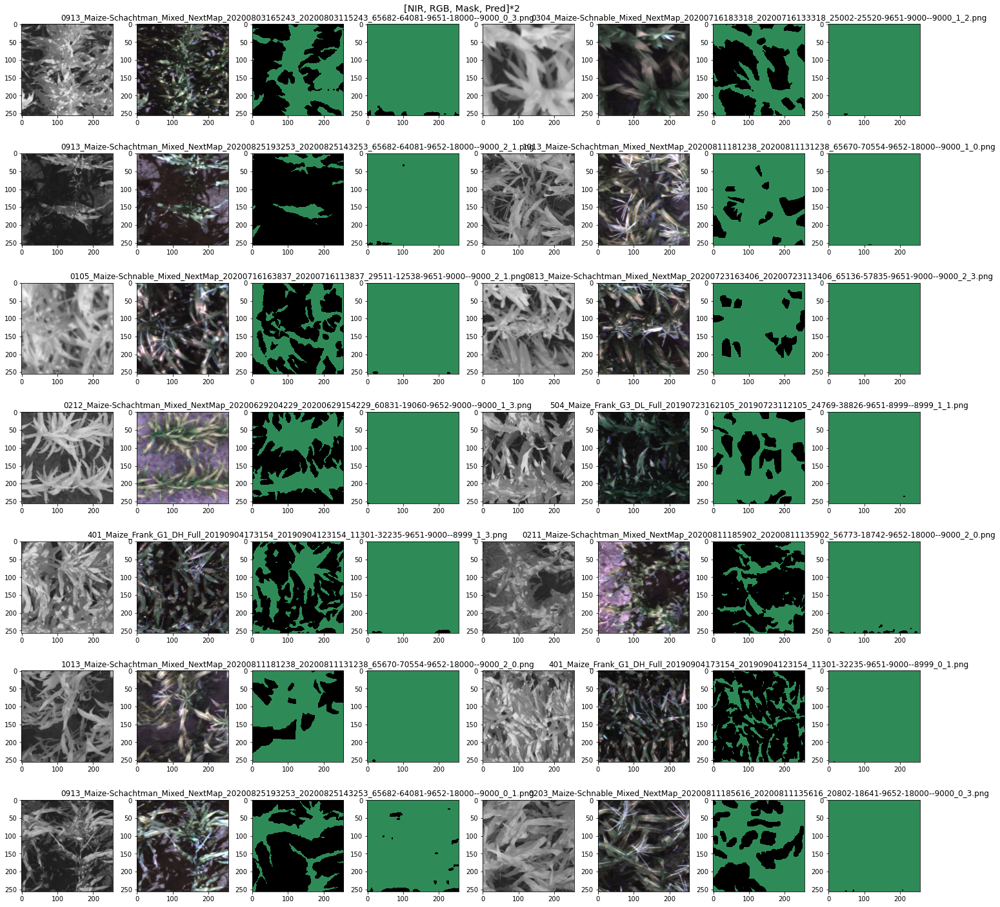

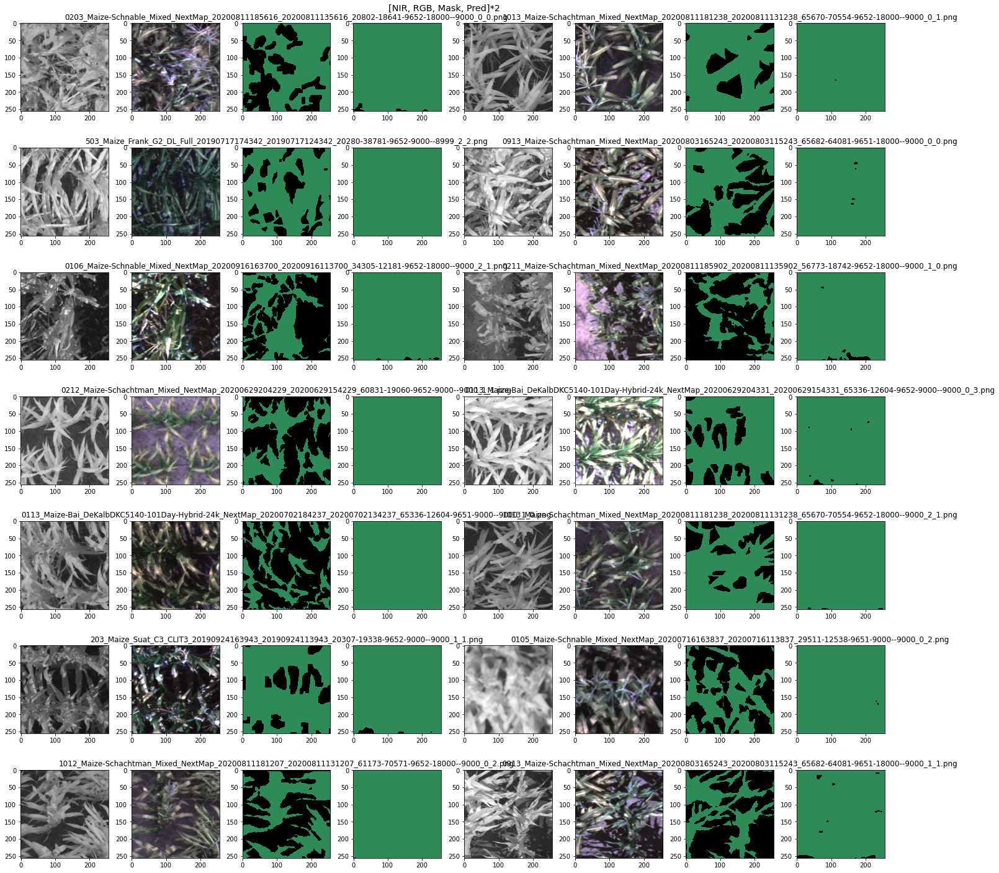

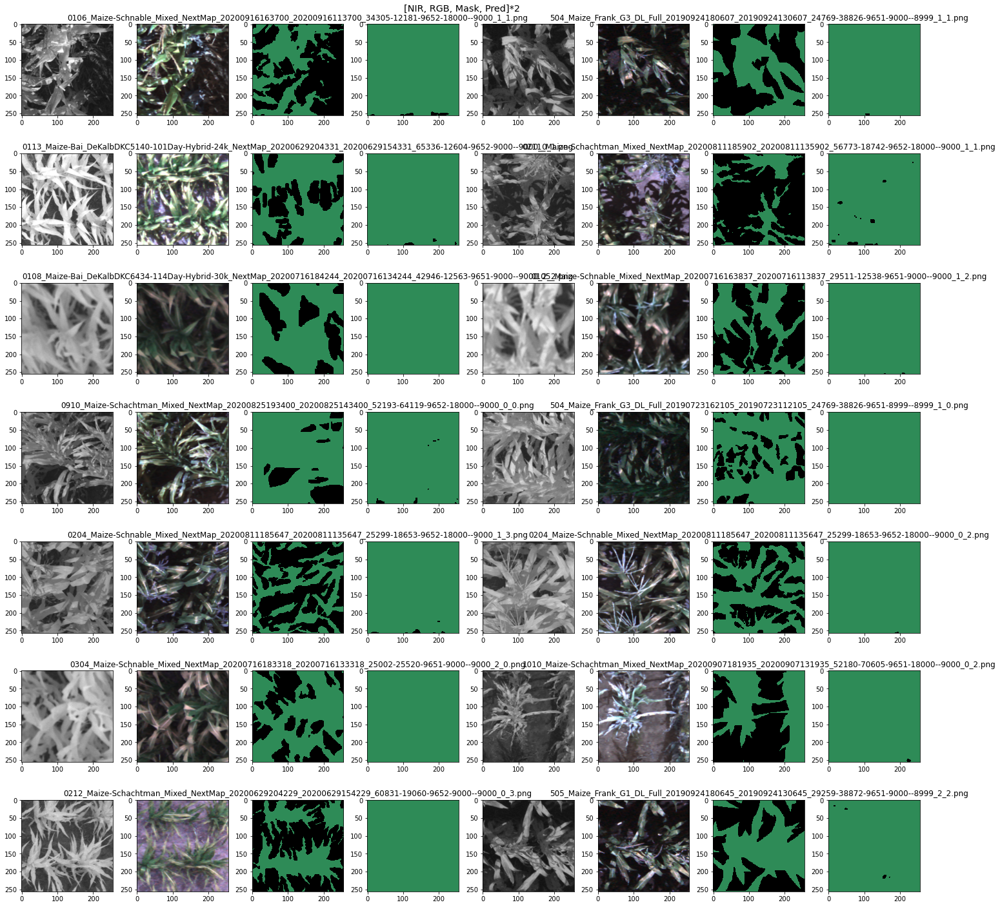

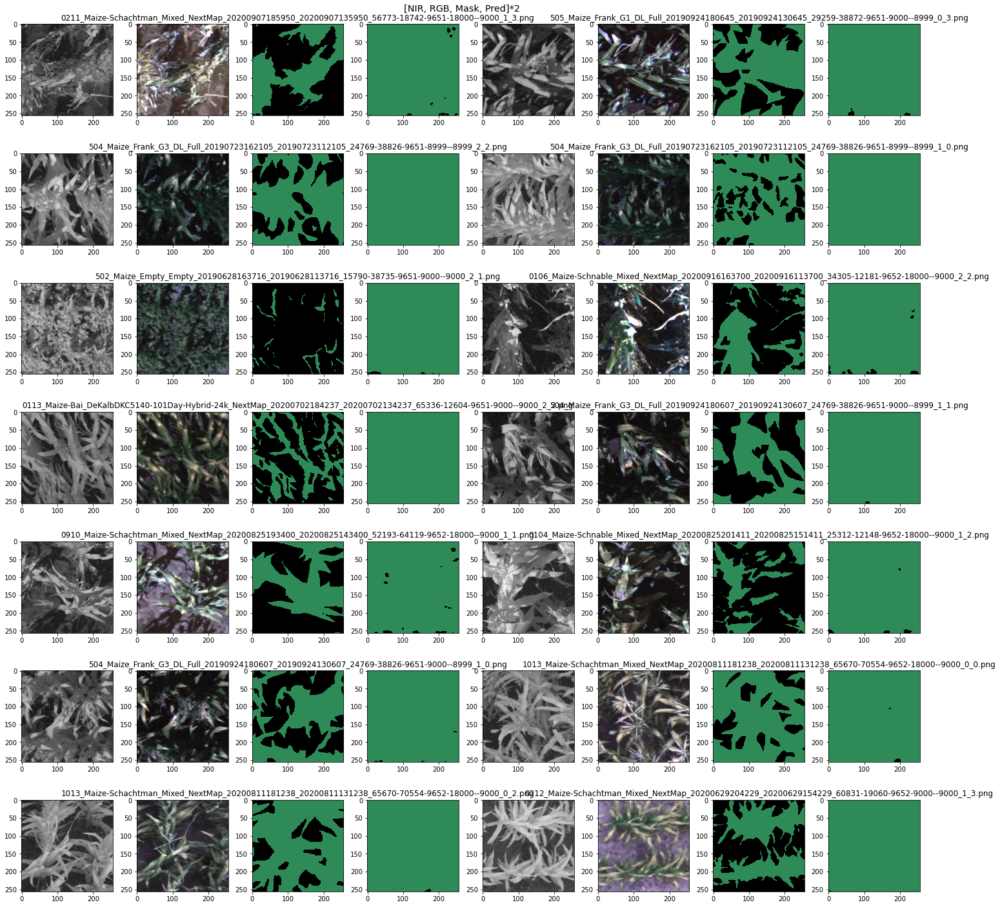

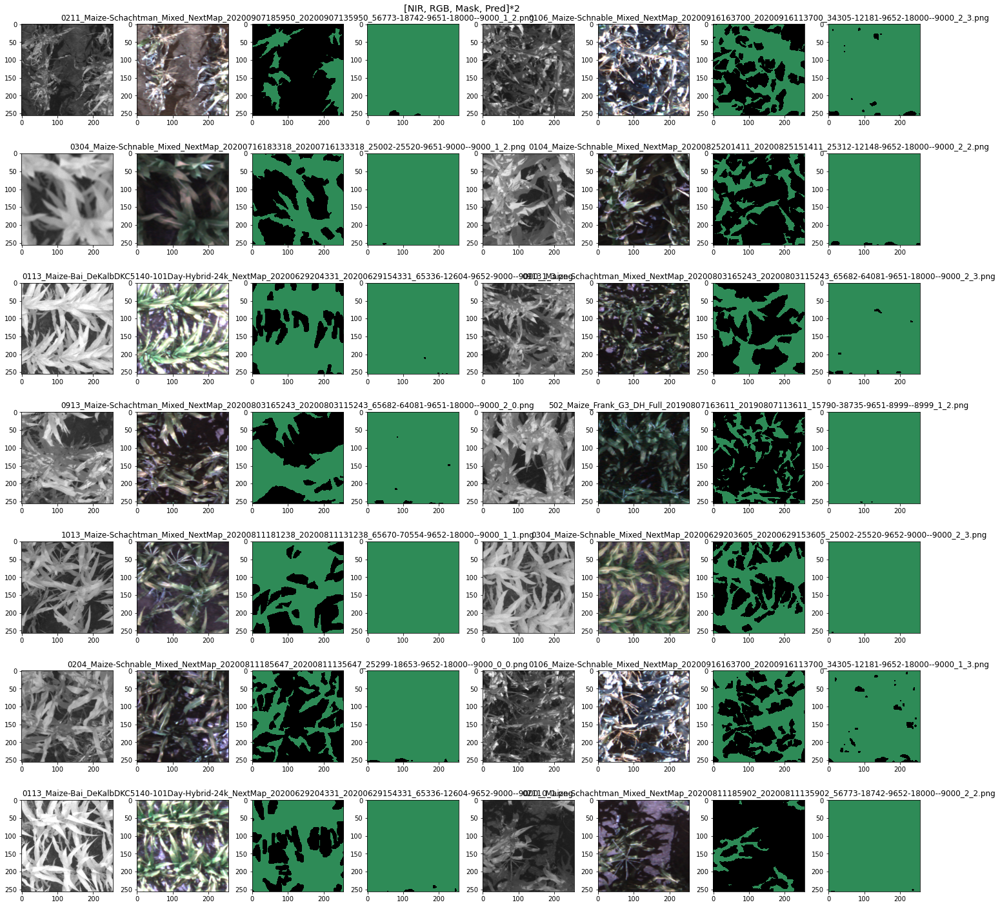

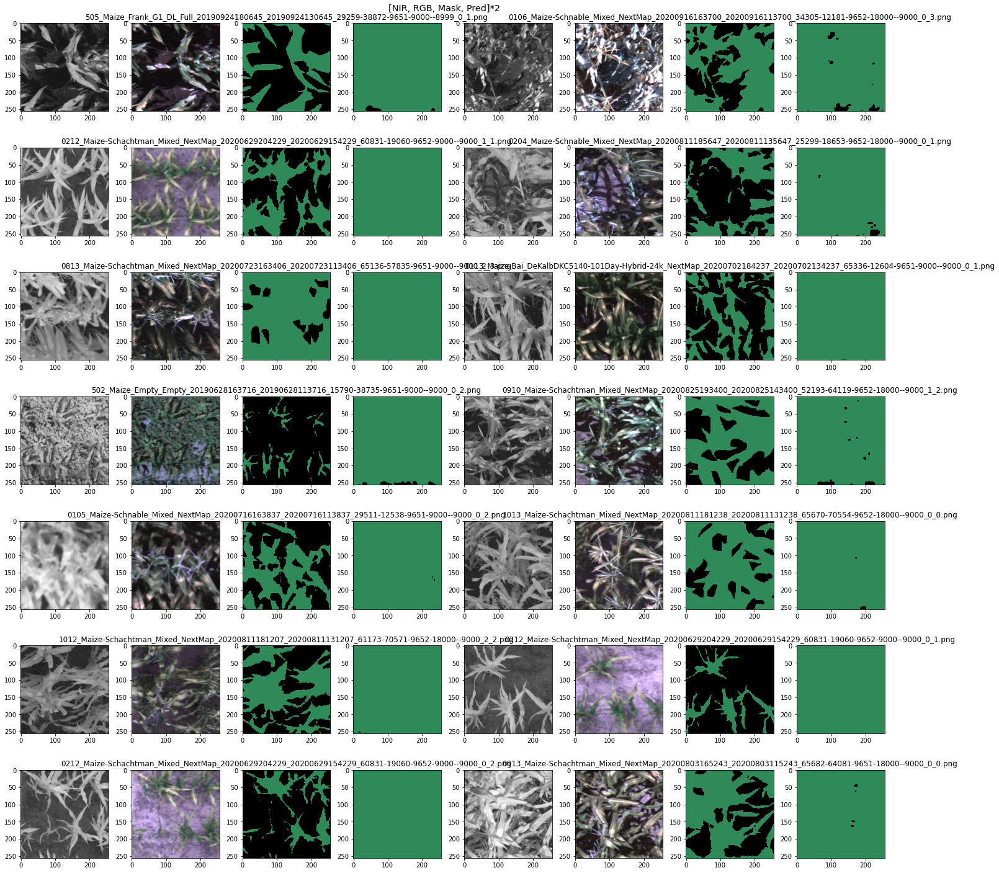

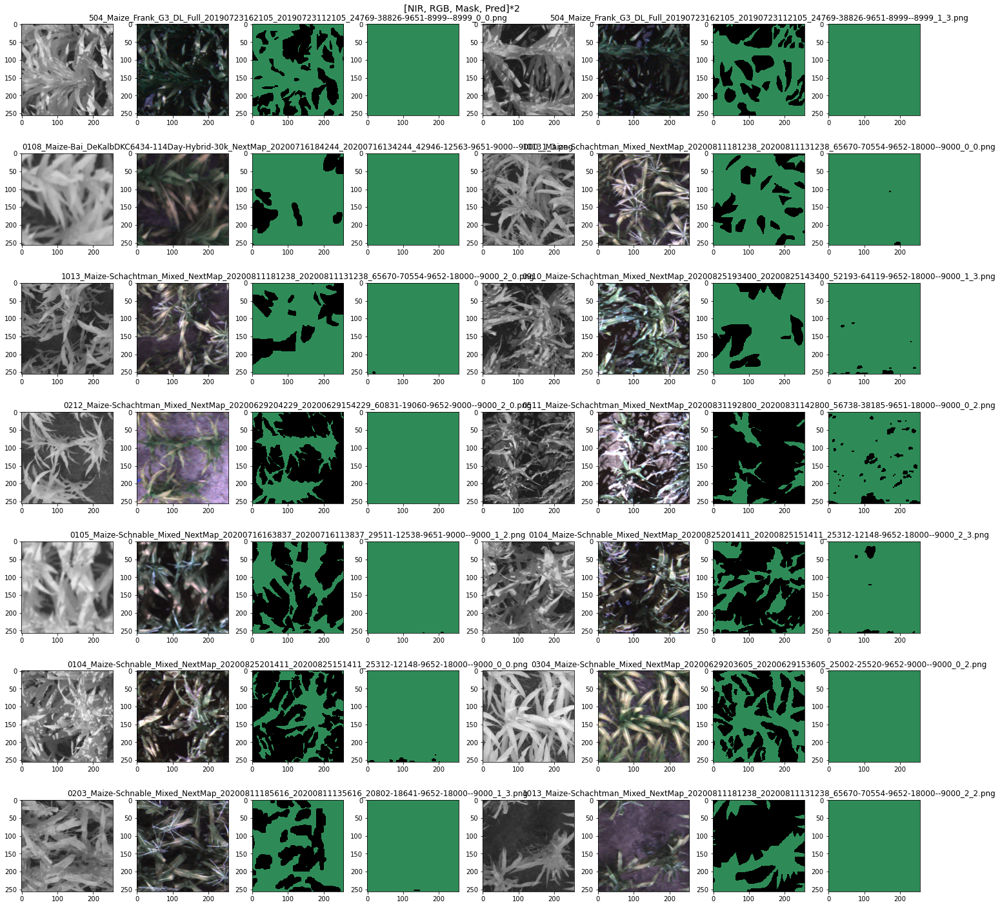

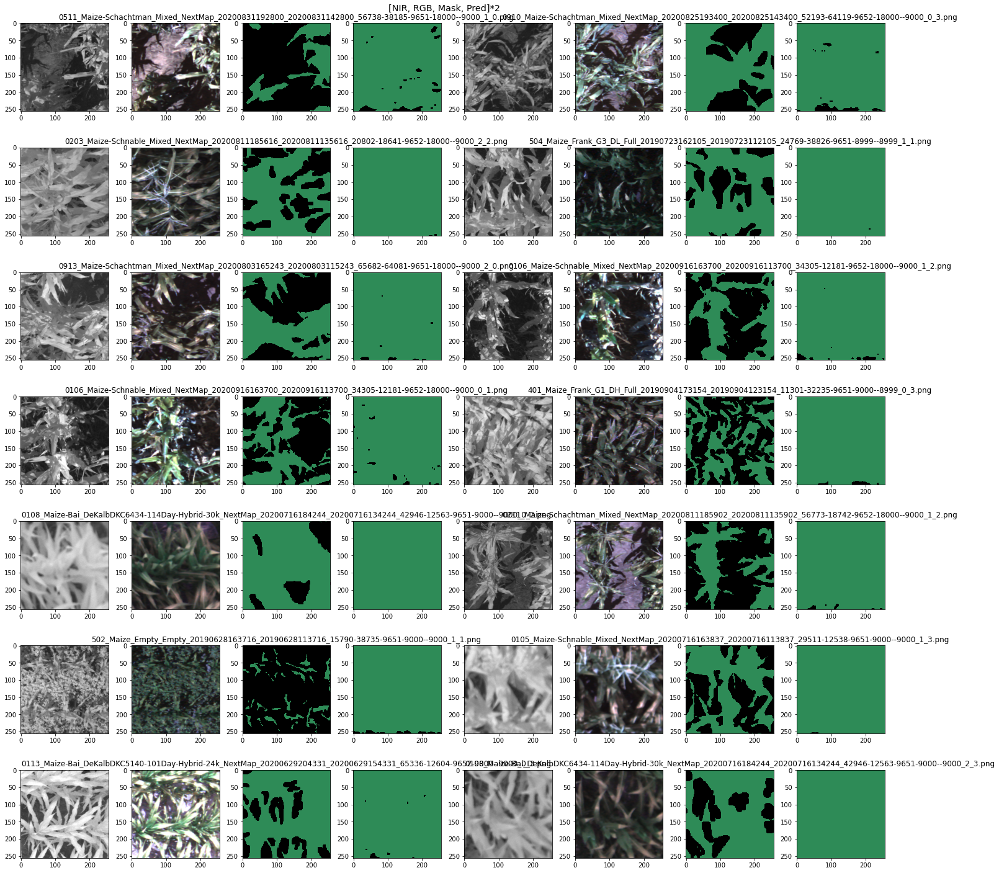

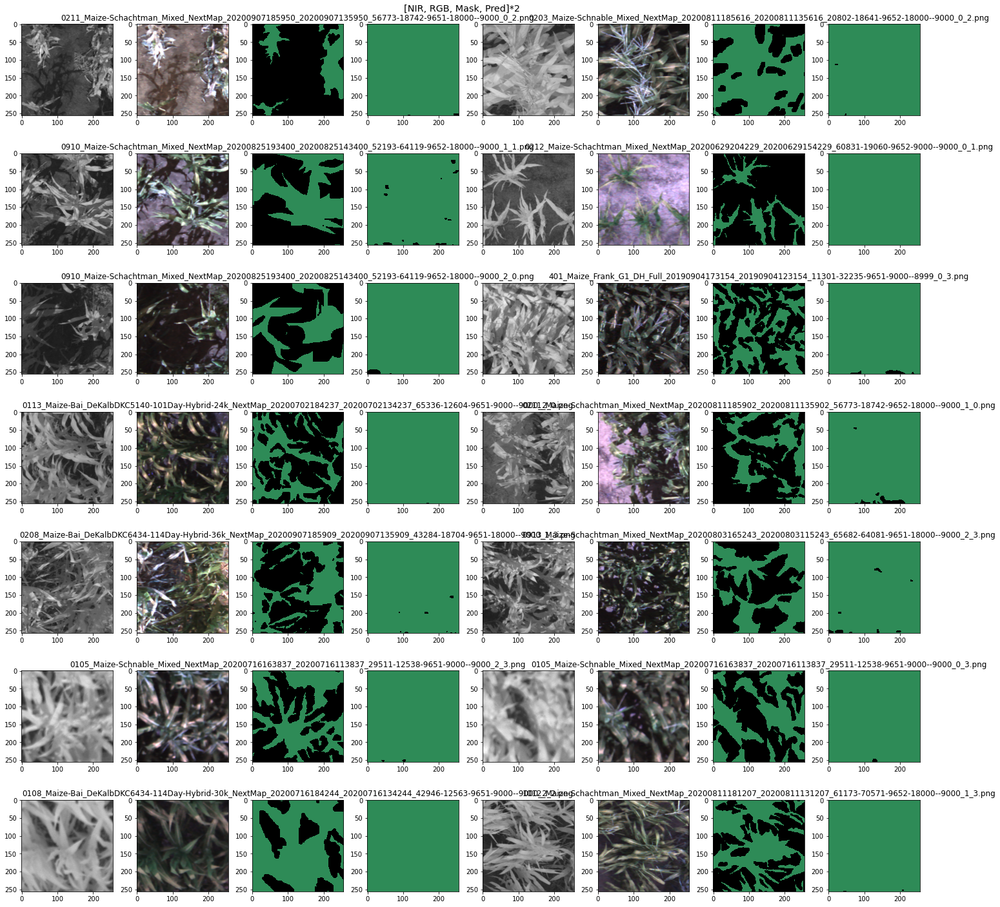

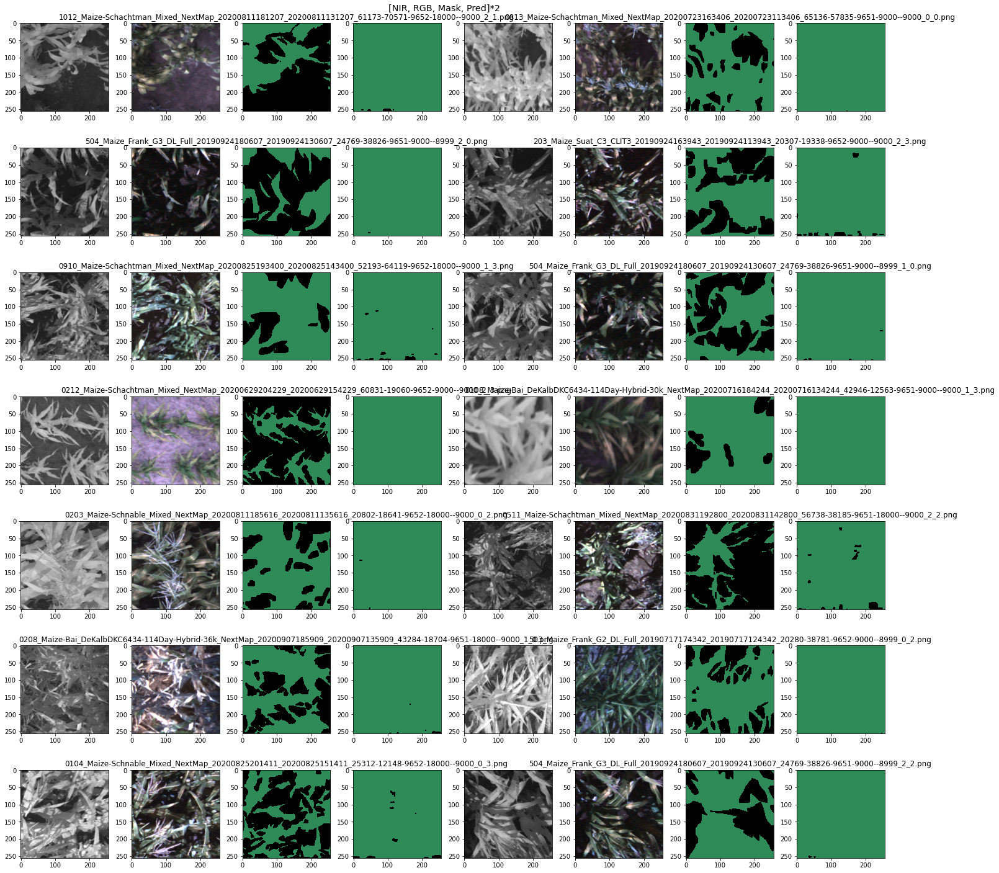

In [27]:
all_NIR_patch_list= test_NIR_patch_list
all_image_patch_list= test_image_patch_list
all_mask_patch_list=test_mask_patch_list
all_image_patch_files=[os.path.basename(f) for f in all_image_patch_list]
all_mask_patch_files=[os.path.basename(f) for f in all_mask_patch_list]
all_NIR_patch_files=[os.path.basename(f) for f in all_NIR_patch_list]

batch_size=8
nrow, n_rep_per_col=7, 2
col_name = ['NIR', 'RGB', 'Mask', 'Pred']*n_rep_per_col
n_images_per_pdf=nrow*n_rep_per_col
image_seed=20
for rs in range(10):
#for rs in np.concatenate(([42], range(10)))[:5]:
    print('seed to show the images: ', rs)
    x=np.linspace(20, 40, 2)
    #x=np.linspace(20, 200, 10)
    #for size in np.append(np.linspace(50, 300, 6), 824)[:]:
    for size in [10][:]:
        size=int(size)
        print('size: ', size)
        random.seed(rs)

        test_pred_mask_patch_list=sorted(glob.glob(result_path+ \
                            r'Multiclass_Prediction/Predict_test_Patches_lr0.001_0.5_batch'+\
                                                   str(batch_size)+'_rs50_is'+str(image_seed)+'_'+\
                                                   str(size)+r'/*.png'))
        all_pred_mask_patch_list=test_pred_mask_patch_list
        print(len(all_pred_mask_patch_list))
        print(len(all_mask_patch_list))


        fig, axes = plt.subplots(nrow,len(col_name), figsize = (20,20))
        fig.suptitle('[NIR, RGB, Mask, Pred]*2', fontsize='x-large')
        #for ax, col in zip(axes[0], col_name):
        #    ax.set_title(col)
        sample_images=random.sample(all_image_patch_files, n_images_per_pdf)
        #sample_images=[all_image_patch_files[i] for i in \
         #              inds[(rs)*n_images_per_pdf:(rs+1)*n_images_per_pdf]]
        for i, file in enumerate(sample_images):
            #print(all_image_patch_files.index(file))
            mask=cv2.imread(all_mask_patch_list[all_image_patch_files.index(file)], 0)


            pred_mask=cv2.imread(all_pred_mask_patch_list[all_image_patch_files.index(file)], 0)

            print(os.path.basename(all_pred_mask_patch_list[all_image_patch_files.index(file)]))
            print(os.path.basename(all_mask_patch_list[all_image_patch_files.index(file)]))
            print(np.unique(pred_mask))
            img=cv2.imread(all_image_patch_list[all_image_patch_files.index(file)])

            print('image index: ', i)
            if i<nrow:
                row=i
                col=[0,1,2,3]
            elif i<2*nrow:
                row=i-nrow
                col=[4,5, 6, 7]
            else:
                row=i-2*nrow
                col=[6,7,8]


            axes[row][col[1]].imshow(img)
            axes[row][col[2]].set_title(os.path.basename(all_mask_patch_list[all_image_patch_files.index(file)]))
            axes[row][col[2]].imshow(mask,  cmap=CustomCmap2, norm=norm)
            axes[row][col[3]].imshow(pred_mask,  cmap=CustomCmap2, norm=norm)
            
            if file in all_NIR_patch_files:
                NIR=cv2.imread(all_NIR_patch_list[all_NIR_patch_files.index(file)])
                axes[row][col[0]].imshow(NIR)

        fig.tight_layout()
        #plt.show()
        fig.savefig(result_path+r'multiclass/visualization/test_vis_random_lr0.001_batch'+str(batch_size)+\
                    '_is'+str(image_seed)+'_trainSize'+str(size)+'_seed'+str(rs)+'.pdf',\
                    bbox_inches='tight', dpi=600)
            #count=np.array([np.count_nonzero(mask==i) for i in range(num_classes)])
            #print(count)

## train

In [ ]:
all_NIR_patch_list= NIR_patch_list
all_image_patch_list=image_patch_list
all_mask_patch_list=mask_patch_list
all_NIR_patch_files=[os.path.basename(f) for f in all_NIR_patch_list]
all_image_patch_files=[os.path.basename(f) for f in all_image_patch_list]
all_mask_patch_files=[os.path.basename(f) for f in all_mask_patch_list]

batch_size=8
nrow, n_rep_per_col=7, 2
col_name = ['NIR', 'RGB', 'Mask', 'Pred']*n_rep_per_col
n_images_per_pdf=nrow*n_rep_per_col

image_seed=290
#for rs in np.concatenate(([42], range(10)))[5:]:
for rs in range(1)[:]:
    print('seed to show the images: ', rs)
    x=np.linspace(20, 40, 2)
    #x=np.linspace(20, 200, 10)
    for size in [10][:]:
        size=int(size)

        random.seed(rs)                           #dropout_rate_lr0.001_0.5_batch32_rs50_is42
        train_list = joblib.load(result_path+'/multiclass/dropout_rate_lr0.001_0.5_batch'+str(batch_size)+\
                                 '_rs50_is'+str(image_seed)+'/train_image_patch_list_'+str(size)+'.pkl')
        selected_files=[os.path.basename(file) for file in train_list]
        
        train_pred_mask_patch_list=sorted(glob.glob(result_path+ \
                                                    r'Multiclass_Prediction/Predict_train_Patches_lr0.001_0.5_batch'+str(batch_size)+\
                                                    '_rs50_is'+str(image_seed)+'_'+\
                                                   str(size)+r'/*.png'))
        all_pred_mask_patch_list=train_pred_mask_patch_list
        print(len(all_pred_mask_patch_list))
        print(len(all_mask_patch_list))


        fig, axes = plt.subplots(nrow,len(col_name), figsize = (20,20))
        fig.suptitle('[NIR, RGB, Mask, Pred]*2', fontsize='x-large')
        #for ax, col in zip(axes[0], col_name):
        #    ax.set_title(col)
        #if len(train_list)>14:
         #   sample_images=random.sample(selected_files, n_images_per_pdf)
        #else:
         #   sample_images=selected_files
        
        sample_images=selected_files[(rs)*n_images_per_pdf:(rs+1)*n_images_per_pdf]


        for i, file in enumerate(sample_images):
            #print(all_image_patch_files.index(file))
            mask=cv2.imread(all_mask_patch_list[all_image_patch_files.index(file)], 0)


            pred_mask=cv2.imread(all_pred_mask_patch_list[all_image_patch_files.index(file)], 0)

            print(os.path.basename(all_pred_mask_patch_list[all_image_patch_files.index(file)]))
            print(os.path.basename(all_mask_patch_list[all_image_patch_files.index(file)]))
            print(np.unique(pred_mask))
            img=cv2.imread(all_image_patch_list[all_image_patch_files.index(file)])

            print('image index: ', i)
            if i<nrow:
                row=i
                col=[0,1,2,3]
            elif i<2*nrow:
                row=i-nrow
                col=[4,5, 6, 7]
            else:
                row=i-2*nrow
                col=[6,7,8]


            axes[row][col[1]].imshow(img)
            axes[row][col[2]].set_title(os.path.basename(all_mask_patch_list[all_image_patch_files.index(file)]))
            axes[row][col[2]].imshow(mask,  cmap=CustomCmap2, norm=norm)
            axes[row][col[3]].imshow(pred_mask,  cmap=CustomCmap2, norm=norm)
            
            if file in all_NIR_patch_files:
                NIR=cv2.imread(all_NIR_patch_list[all_NIR_patch_files.index(file)])
                axes[row][col[0]].imshow(NIR)

        fig.tight_layout()
        #plt.show()
        fig.savefig(result_path+r'multiclass/visualization/train_vis_random_lr0.001_batch'+str(batch_size)+\
                    '_is'+str(image_seed)+'_trainSize'+\
                    str(size)+'_seed'+str(rs)+'.pdf', bbox_inches='tight', dpi=600)
            #count=np.array([np.count_nonzero(mask==i) for i in range(num_classes)])
            #print(count)
    

## validation

In [ ]:
all_NIR_patch_list= NIR_patch_list
all_image_patch_list=image_patch_list
all_mask_patch_list=mask_patch_list
all_NIR_patch_files=[os.path.basename(f) for f in all_NIR_patch_list]
all_image_patch_files=[os.path.basename(f) for f in all_image_patch_list]
all_mask_patch_files=[os.path.basename(f) for f in all_mask_patch_list]

batch_size=8
nrow, n_rep_per_col=7, 2
col_name = ['NIR', 'RGB', 'Mask', 'Pred']*n_rep_per_col
n_images_per_pdf=nrow*n_rep_per_col

image_seed=290
#for rs in np.concatenate(([42], range(10)))[5:]:
for rs in range(2)[:]:
    print('seed to show the images: ', rs)
    x=np.linspace(20, 40, 2)
    #x=np.linspace(20, 200, 10)
    for size in [10][:]:
        size=int(size)

        random.seed(rs)                           #dropout_rate_lr0.001_0.5_batch32_rs50_is42
        val_list = joblib.load(result_path+'/multiclass/dropout_rate_lr0.001_0.5_batch'+str(batch_size)+\
                                 '_rs50_is'+str(image_seed)+'/val_image_patch_list_'+str(size)+'.pkl')
        selected_files=[os.path.basename(file) for file in val_list]
        
        val_pred_mask_patch_list=sorted(glob.glob(result_path+ \
                                                    r'Multiclass_Prediction/Predict_train_Patches_lr0.001_0.5_batch'+str(batch_size)+\
                                                    '_rs50_is'+str(image_seed)+'_'+\
                                                   str(size)+r'/*.png'))
        all_pred_mask_patch_list=val_pred_mask_patch_list
        print(len(all_pred_mask_patch_list))
        print(len(all_mask_patch_list))


        fig, axes = plt.subplots(nrow,len(col_name), figsize = (20,20))
        fig.suptitle('[NIR, RGB, Mask, Pred]*2', fontsize='x-large')
        #for ax, col in zip(axes[0], col_name):
        #    ax.set_title(col)
        #if len(val_list)>14:
         #   sample_images=random.sample(selected_files, n_images_per_pdf)
        #else:
         #   sample_images=selected_files
        
        sample_images=selected_files[(rs)*n_images_per_pdf:(rs+1)*n_images_per_pdf]


        for i, file in enumerate(sample_images):
            #print(all_image_patch_files.index(file))
            mask=cv2.imread(all_mask_patch_list[all_image_patch_files.index(file)], 0)


            pred_mask=cv2.imread(all_pred_mask_patch_list[all_image_patch_files.index(file)], 0)

            print(os.path.basename(all_pred_mask_patch_list[all_image_patch_files.index(file)]))
            print(os.path.basename(all_mask_patch_list[all_image_patch_files.index(file)]))
            print(np.unique(pred_mask))
            img=cv2.imread(all_image_patch_list[all_image_patch_files.index(file)])

            print('image index: ', i)
            if i<nrow:
                row=i
                col=[0,1,2,3]
            elif i<2*nrow:
                row=i-nrow
                col=[4,5, 6, 7]
            else:
                row=i-2*nrow
                col=[6,7,8]


            axes[row][col[1]].imshow(img)
            axes[row][col[2]].set_title(os.path.basename(all_mask_patch_list[all_image_patch_files.index(file)]))
            axes[row][col[2]].imshow(mask,  cmap=CustomCmap2, norm=norm)
            axes[row][col[3]].imshow(pred_mask,  cmap=CustomCmap2, norm=norm)
            
            if file in all_NIR_patch_files:
                NIR=cv2.imread(all_NIR_patch_list[all_NIR_patch_files.index(file)])
                axes[row][col[0]].imshow(NIR)

        fig.tight_layout()
        #plt.show()
        fig.savefig(result_path+r'multiclass/visualization/val_vis_random_lr0.001_batch'+str(batch_size)+\
                    '_is'+str(image_seed)+'_trainSize'+\
                    str(size)+'_seed'+str(rs)+'.pdf', bbox_inches='tight', dpi=600)
            #count=np.array([np.count_nonzero(mask==i) for i in range(num_classes)])
            #print(count)
    

## excluded

In [ ]:
all_NIR_patch_list= exclude_NIR_patch_list
all_image_patch_list= exclude_image_patch_list
all_mask_patch_list=exclude_mask_patch_list
all_image_patch_files=[os.path.basename(f) for f in all_image_patch_list]
all_mask_patch_files=[os.path.basename(f) for f in all_mask_patch_list]
all_NIR_patch_files=[os.path.basename(f) for f in all_NIR_patch_list]

batch_size=8
image_seed=42
nrow, n_rep_per_col=7, 2
col_name = ['NIR', 'RGB', 'Mask', 'Pred']*n_rep_per_col
n_images_per_pdf=nrow*n_rep_per_col

for rs in range(5)[:]:
#for rs in np.concatenate(([42], range(10)))[:]:
    print('seed to show the images: ', rs)
    x=np.linspace(20, 40, 2)
    #x=np.linspace(20, 200, 10)
    #for size in np.append(np.linspace(50, 300, 6), 824)[:]:
    for size in [1436][:]:
        size=int(size)
        print('size: ', size)
        random.seed(rs)
        #Predict_exclude_Patches_lr0.001_0.5_batch8_rs50_is100_600
        exclude_pred_mask_patch_list=sorted(glob.glob(result_path+ \
                                                   r'Multiclass_Prediction/Predict_exclude_Patches_lr0.001_0.5_batch'+\
                                                      str(batch_size)+'_rs50_is'+str(image_seed)+'_'+str(size)+\
                                                      r'/*.png'))
        all_pred_mask_patch_list=exclude_pred_mask_patch_list
        print(len(all_pred_mask_patch_list))
        print(len(all_mask_patch_list))


        fig, axes = plt.subplots(nrow,len(col_name), figsize = (20,20))
        fig.suptitle('[NIR, RGB, Mask, Pred]*2', fontsize='x-large')
        #for ax, col in zip(axes[0], col_name):
        #    ax.set_title(col)
        sample_images=random.sample(all_image_patch_files, n_images_per_pdf)

        for i, file in enumerate(sample_images):
            #print(all_image_patch_files.index(file))
            mask=cv2.imread(all_mask_patch_list[all_image_patch_files.index(file)], 0)


            pred_mask=cv2.imread(all_pred_mask_patch_list[all_image_patch_files.index(file)], 0)

            print(os.path.basename(all_pred_mask_patch_list[all_image_patch_files.index(file)]))
            print(os.path.basename(all_mask_patch_list[all_image_patch_files.index(file)]))
            print(np.unique(pred_mask))
            img=cv2.imread(all_image_patch_list[all_image_patch_files.index(file)])

            print('image index: ', i)
            if i<nrow:
                row=i
                col=[0,1,2,3]
            elif i<2*nrow:
                row=i-nrow
                col=[4,5, 6, 7]
            else:
                row=i-2*nrow
                col=[6,7,8]


            axes[row][col[1]].imshow(img)
            axes[row][col[2]].set_title(os.path.basename(all_mask_patch_list[all_image_patch_files.index(file)]))
            axes[row][col[2]].imshow(mask,  cmap=CustomCmap2, norm=norm)
            axes[row][col[3]].imshow(pred_mask,  cmap=CustomCmap2, norm=norm)
            
            if file in all_NIR_patch_files:
                NIR=cv2.imread(all_NIR_patch_list[all_NIR_patch_files.index(file)])
                axes[row][col[0]].imshow(NIR)

        fig.tight_layout()
        #plt.show() dark_test_vis_random_lr0.001_batch8_is42_trainSize1436_seed0
        fig.savefig(result_path+r'multiclass/visualization/exclude_vis_random_lr0.001_batch8_is'+str(image_seed)+'_trainSize'+str(size)+'_seed'+str(rs)+'.pdf',\
                    bbox_inches='tight', dpi=600)
            #count=np.array([np.count_nonzero(mask==i) for i in range(num_classes)])
            #print(count)